In [1]:
import pylab as plt
import numpy as np
import skimage.transform
import skimage.restoration
from tqdm import tqdm
import skimage.filters
import torch
import torch.nn as nn

In [2]:
from fft_conv_pytorch import fft_conv, FFTConv2d

In [265]:
D = 400

In [266]:
imgI = np.load("/home/weniger/codes/pyrofit-lensing-analysis/mock_data/sources/antennae.npy")
imgI = np.load("/home/weniger/codes/pyrofit-lensing-analysis/mock_data/sources/hoags_object.npy")
imgI = skimage.transform.resize(imgI, [D, D])

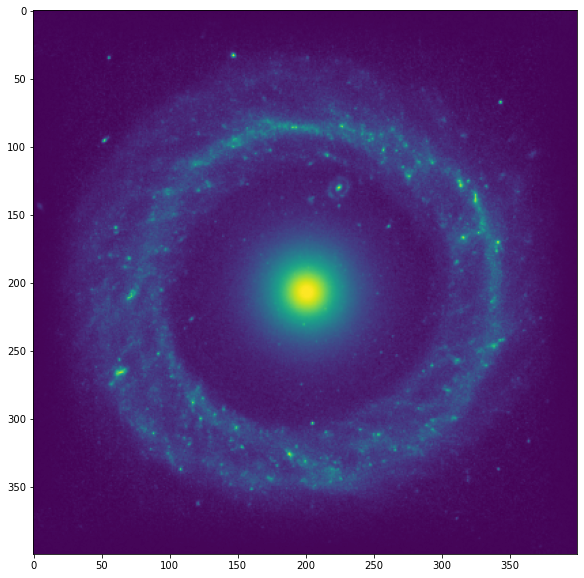

In [267]:
plt.figure(figsize = (10, 10))
plt.imshow(imgI)

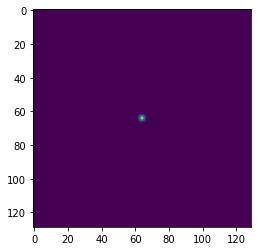

In [268]:
K = 129
channels = [1, 5, 25]
C = len(channels)

kernel = np.zeros((C, C, K, K))
x = np.linspace(-64, 64, K)
X, Y = np.meshgrid(x, x)
R = (X**2 + Y**2)**0.5

for i, s in enumerate(channels):
    kern = np.exp(-0.5*R**2/s**2)
    kern /= (kern**2).sum()**0.5
    kernel[i, i] = kern
    
plt.imshow(kernel[0, 0])

In [269]:
kernel_gpu = torch.tensor(kernel).float()

In [270]:
gaussian_weights = nn.Parameter(kernel_gpu.cuda())
conv = FFTConv2d(in_channels = C, out_channels = C, kernel_size=K, bias=False, padding = int(K/2))
with torch.no_grad():
    conv.weight = gaussian_weights

In [271]:
def model(seeds):
    #seeds = seeds - torch.tensor([1., 2., 3.]).cuda().float().unsqueeze(1).unsqueeze(2)
    #seeds = torch.nn.functional.leaky_relu(seeds, negative_slope = 0.0001)
    seeds = seeds * torch.tensor([1., 1., 1.]).cuda().float().unsqueeze(1).unsqueeze(2)
    imgc = conv(seeds.unsqueeze(0)).squeeze(0).squeeze(0)
    #imgc = torch.nn.functional.leaky_relu(imgc)
    #img = imgc.sum(axis = 0)*4
    img = torch.exp(imgc[2]*0.8)*torch.exp(imgc[1]*0.5)*torch.exp(imgc[0]*0.2)
    #img = imgc[0]*0.3
    return img

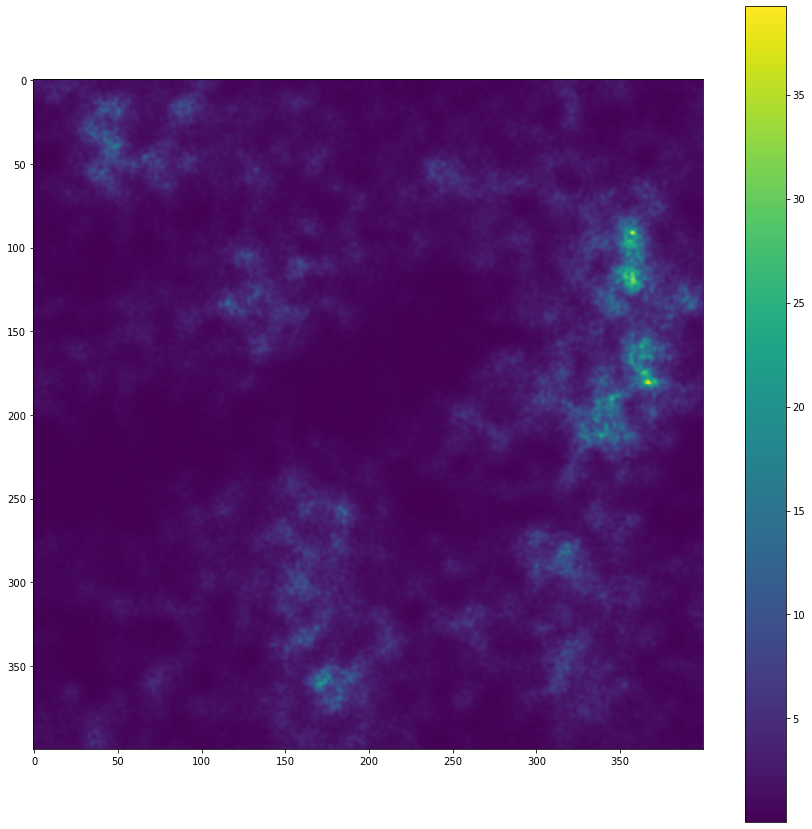

In [272]:
plt.figure(figsize=(15, 15))
imgr = model(torch.randn(C, D, D).cuda()).detach()
plt.imshow(imgr.detach().cpu())
plt.colorbar()

In [273]:
img0 = torch.tensor(imgI).float().cuda()*30

In [274]:
img0 = imgr

torch.Size([400, 400])

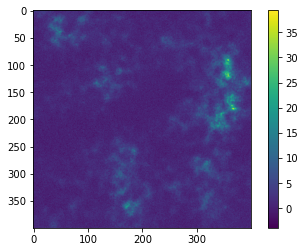

In [275]:
sigma= 1.0 * torch.ones_like(img0)
#sigma[100:120] += 10
noise = torch.randn(img0.shape).cuda()*sigma
img0n = img0+noise
plt.imshow(img0n.detach().cpu())
plt.colorbar()
img0n.shape

In [341]:
log_scales = torch.tensor([2.0, 0.0, 0.0]).cuda().float()
scales = torch.exp(log_scales)
seeds = torch.randn(3, D, D).cuda()/torch.exp(log_scales).unsqueeze(1).unsqueeze(2)
Gseeds = torch.ones_like(seeds)
Gscales = torch.ones_like(scales)*1e3
alpha = 0.99
losses1 = []
losses2 = []
losses3 = []
losses = []
imgs = []
c = 0

In [359]:
for epsilon in [1e-3]:
    print(epsilon)
    #epsilon = epsilon*1e-1
    for _ in tqdm(range(300)):
        seeds.requires_grad = True
        log_scales.requires_grad = True  # Flat prior in log space, drift towards small scales?
        
        scales = torch.exp(log_scales)
        img = model(seeds)
        
        if c % 500 == 0:
            imgs.append(img.detach().cpu().numpy())
        c+=1
        
        # Image likelihood
        sn = 0.5*((img - img0n)**2)/sigma**2-50**2*0.5
        loss1 = torch.maximum(sn, torch.zeros_like(sn)).sum()*0
        
        # Seeds*scale density
        # N*STD - N*log(STD) --> 1 = 1/STD --> STD = 1
        loss2 = ((seeds*scales.unsqueeze(1).unsqueeze(2))**2).sum()*0.5
        
        # Sigma of seeds
        #std = torch.std(seeds, [1, 2]).detach()
        #loss3 = -400*400*torch.log(std*scales).sum()
        #loss3 -= torch.log(scales).sum()
        #loss3 -= (1000/scales).sum()
        
        # Loss backprop!
        loss = loss1 + loss2# + loss3
        loss.backward()
        losses1.append(loss1.item())
        losses2.append(loss2.item())
        losses3.append(loss3.item())
        losses.append(loss.item())

        Gseeds = alpha*Gseeds + (1-alpha)*seeds.grad**2
        Gscales = alpha*Gscales + (1-alpha)*log_scales.grad**2
        Mseeds = 1/(Gseeds**0.5 + 1e-8)
        Mscales = 1/(Gscales**0.5 + 1e-8)
        
        seeds = seeds.detach() - epsilon*Mseeds*seeds.grad 
        seeds = seeds + torch.randn(seeds.size()).cuda()*(epsilon*Mseeds*2)**0.5
        
        #log_scales = log_scales.detach() - epsilon*Mscales*log_scales.grad
        #scales = scales + torch.randn(scales.size()).cuda()*(epsilon*Mscales*2)**0.5
    print(losses1[-1], losses2[-1], losses3[-1], losses[-1])
    print(scales, alpha)
    alpha = 1 - (1-alpha)*0.5
    
# Remaining scales drift seems to be associated with alpha < 1

  3%|▎         | 8/300 [00:00<00:03, 77.84it/s]

0.001


100%|██████████| 300/300 [00:03<00:00, 85.44it/s]

0.0 286719.3125 -1279.1220703125 286719.3125
tensor([7.3891, 1.0000, 1.0000], device='cuda:0', grad_fn=<ExpBackward>) 0.999375


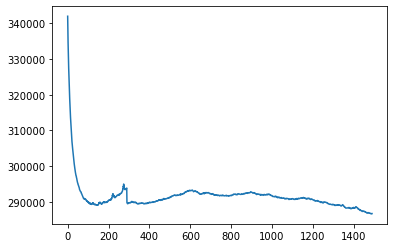

In [360]:
c = 1000
plt.plot(losses[10:])
#plt.plot(losses1[c:])
#plt.plot(losses2[c:])
#plt.plot(losses3[c:])

1.026572
1.1505573
1.0986434


tensor([7.3891, 1.0000, 1.0000], device='cuda:0', grad_fn=<ExpBackward>)

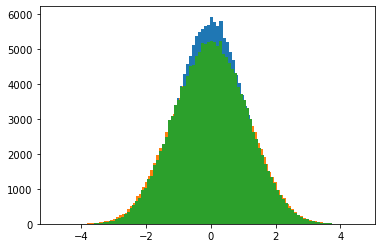

In [361]:
for i in range(C):
    s = (seeds[i]*scales[i]).cpu().detach().numpy().flatten()
    print(s.std())
    plt.hist(s, bins = 100);
scales

- Start -1: `tensor([0.3893, 0.2051, 0.0832], device='cuda:0', grad_fn=<ExpBackward>)`
- Start +1: `tensor([0.3866, 0.2110, 0.0797], device='cuda:0', grad_fn=<ExpBackward>)`
- Start 0 with mask: `tensor([0.3386, 0.1983, 0.1097], device='cuda:0', grad_fn=<ExpBackward>)`
That's actually pretty close!

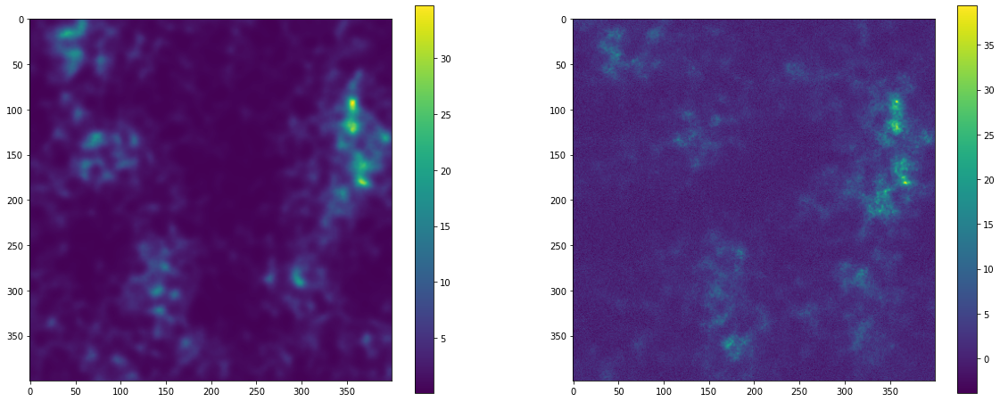

In [362]:
plt.figure(figsize=(20, 8))
plt.subplot(121)
img = model(seeds)
plt.imshow(img.detach().cpu())
plt.colorbar()
plt.subplot(122)
plt.imshow(img0n.detach().cpu())
plt.colorbar()

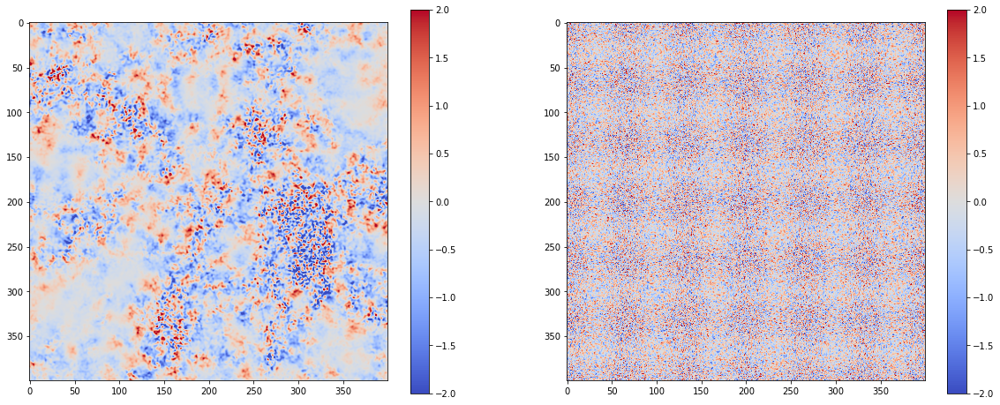

In [162]:
plt.figure(figsize=(20, 8))
plt.subplot(121)
plt.imshow((img.detach().cpu() - img0.detach().cpu())/sigma.cpu(), vmin = -2, vmax = 2, cmap = 'coolwarm')
plt.colorbar()
plt.subplot(122)
plt.imshow((img0.detach().cpu() - img0n.detach().cpu())/sigma.cpu(), vmin = -2, vmax = 2, cmap = 'coolwarm')
plt.colorbar()

<Figure size 1440x1440 with 0 Axes>

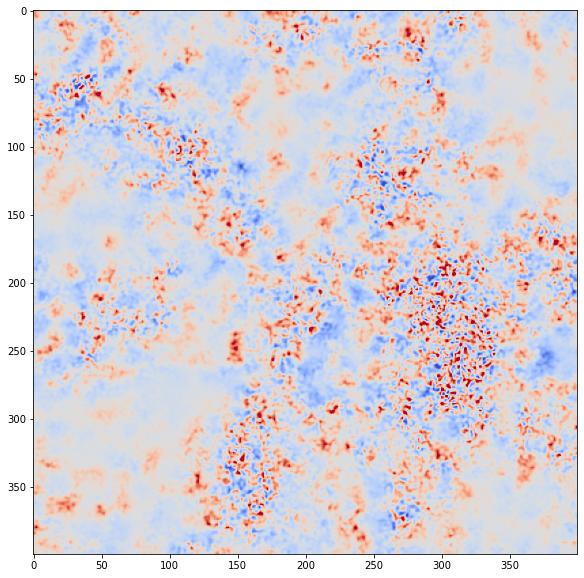

In [166]:
import matplotlib.animation
import matplotlib.pyplot as plt
import numpy as np
plt.rcParams["animation.html"] = "jshtml"
#plt.rcParams['figure.dpi'] = 150  
plt.ioff()

plt.figure(figsize = (20, 20))
fig, ax = plt.subplots(figsize = (10, 10))

imgs_mean = sum(imgs)/len(imgs)

def animate(i):
    plt.cla()
    plt.imshow(imgs[i]-imgs_mean, vmin = -2, vmax = 2, cmap = 'coolwarm')
    
matplotlib.animation.FuncAnimation(fig, animate, frames=len(imgs))